#  **Brief Introduction to Explainable Artificial Intelligence (XAI)**
* # Since it is a vaste subject, we only introduce main concepts
* # And practically test a couple of approaches

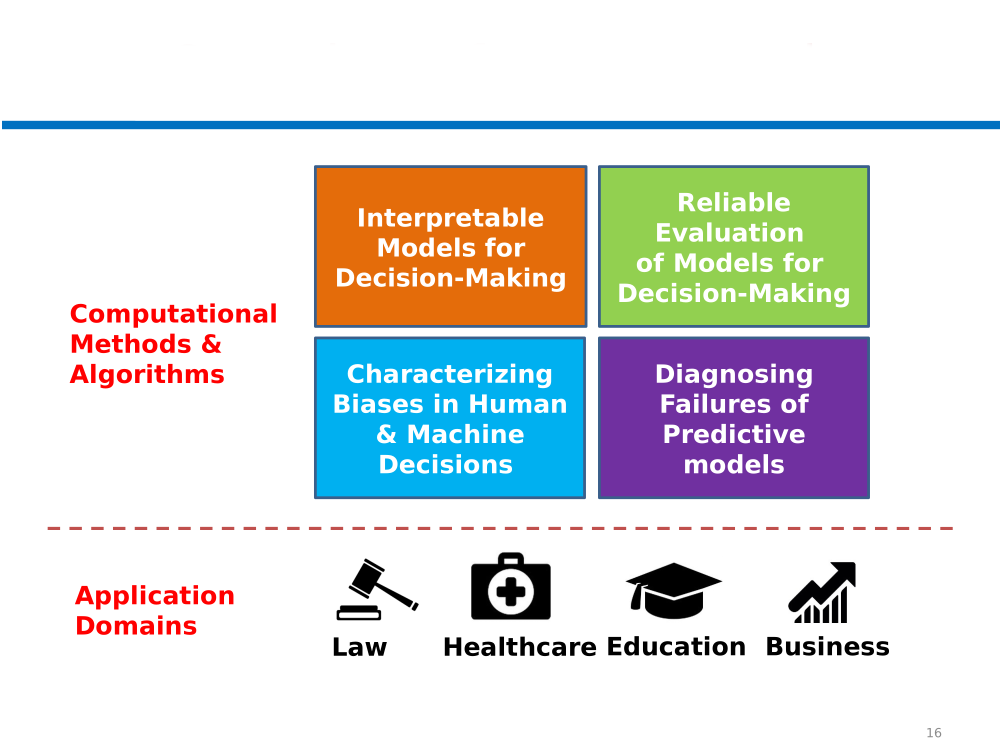

# **THE NEED OF INTERPRETABILITY**
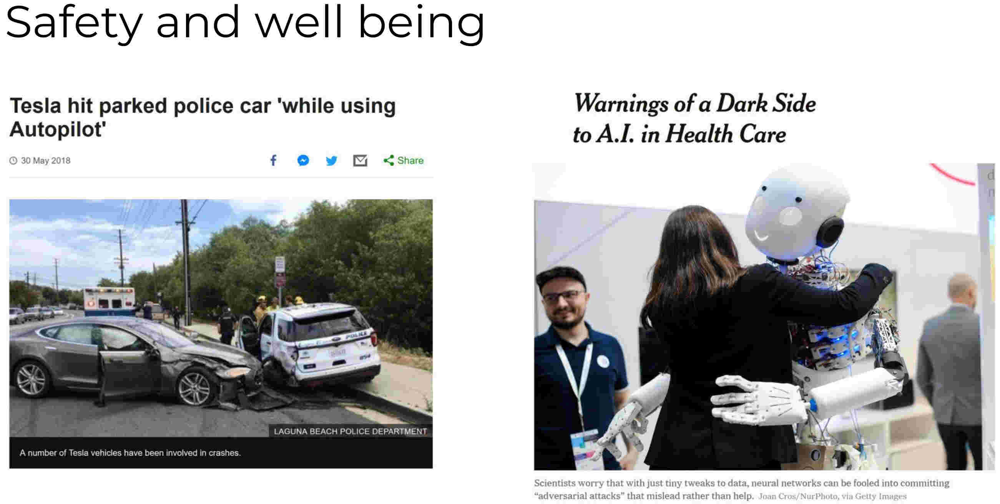

# **LEGAL ISSUES**:
* ## Are there restrictions on the use of automated  decision-making?
> * ## Answer: **Yes, individuals should not be subject to a decision that is based solely on automated processing (such as algorithms) and that is legally binding or which significantly affects them** (European Commission)

# **FUNDAMENTAL PROBLEMS**
* ## We don't trust the models
* ## We don't know what happens in extreme cases
* ## Mistakes can be expensive / harmful
* ## Does the model makes similar mistakes as humans?
* ## How to change model when things go wrong?

# **INTERPRETABILITY is one way we try to deal with these problems**

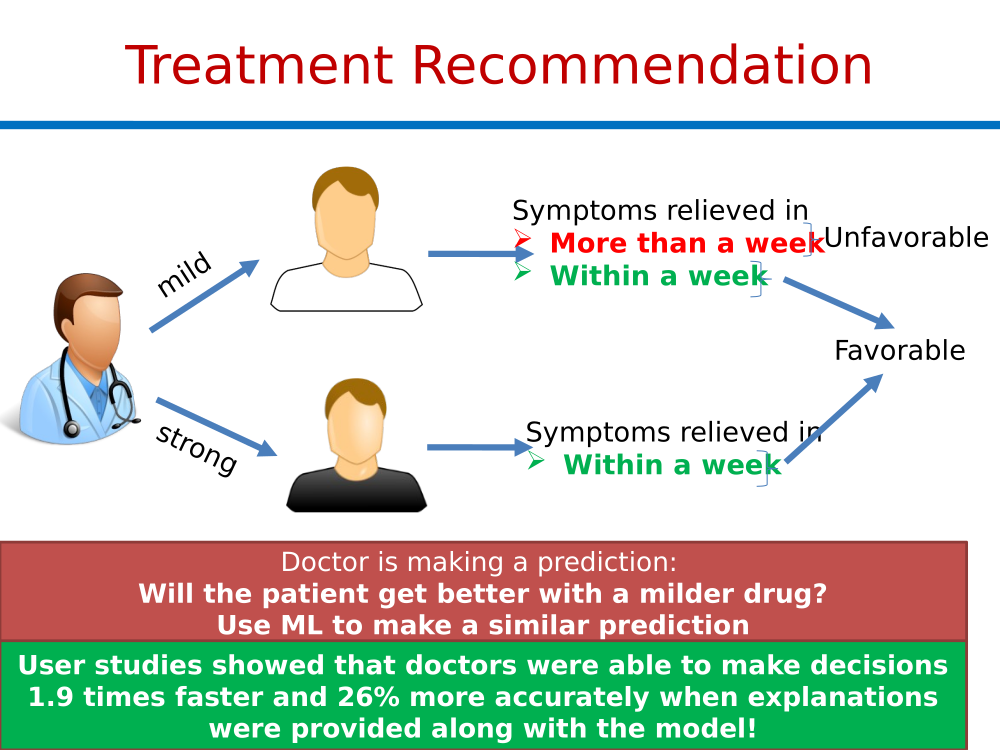

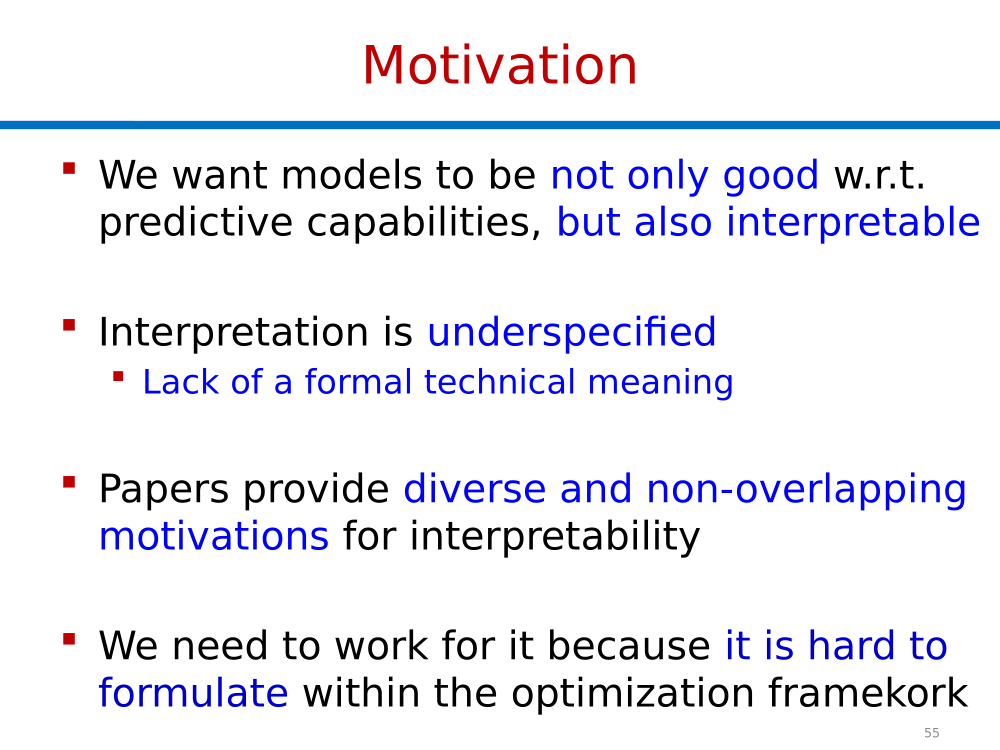
Ref.: Zachary C. Lipton. 2018. The Mythos of Model Interpretability: In machine learning, the concept of interpretability is both important and slippery. 31–57. https://doi.org/10.1145/3236386.3241340

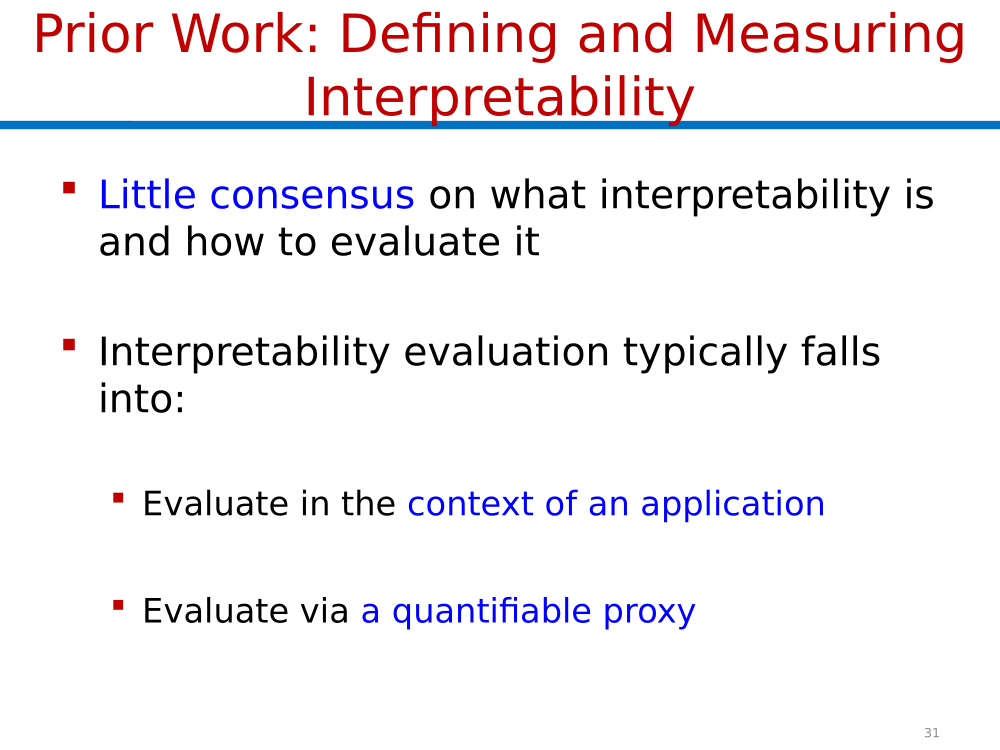

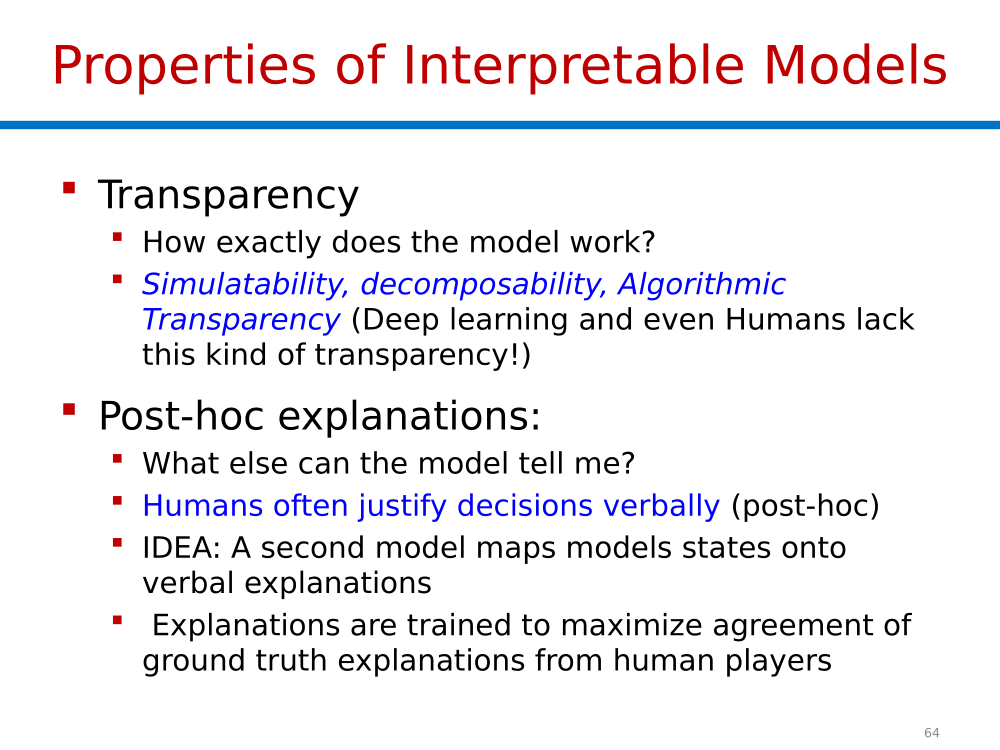

# **INHERENT EXPLANABILITY**
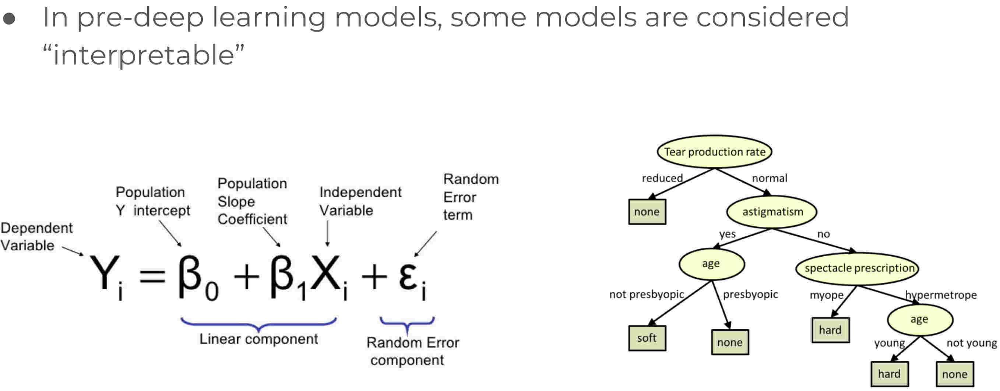

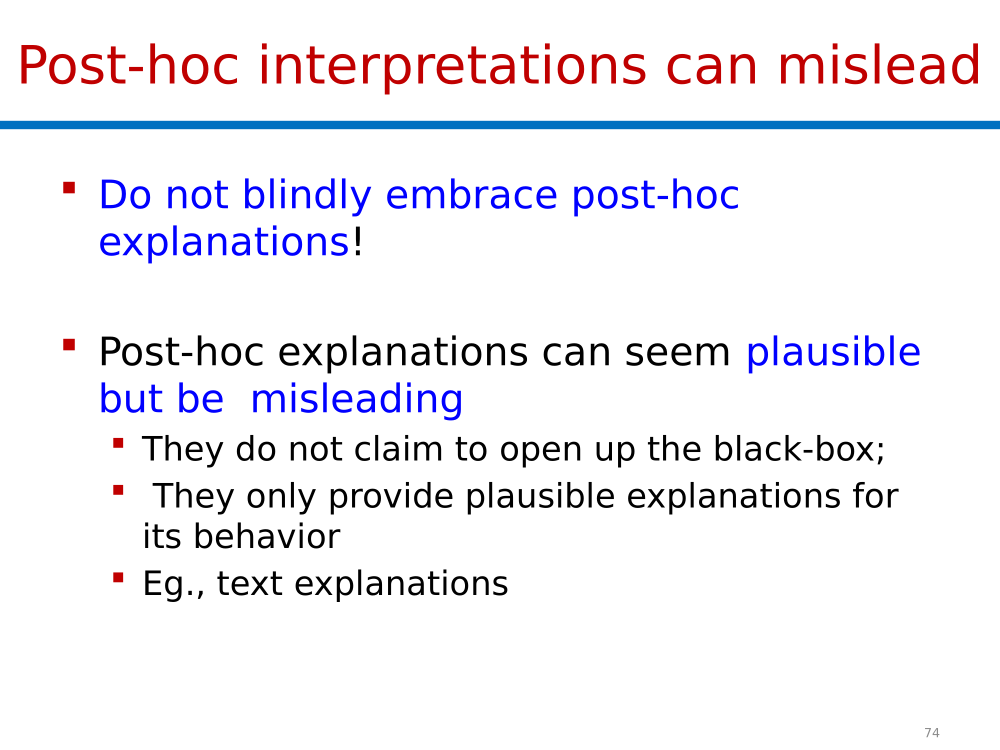
# **Unfortunately, sometimes we have only post-hoc explanations available**

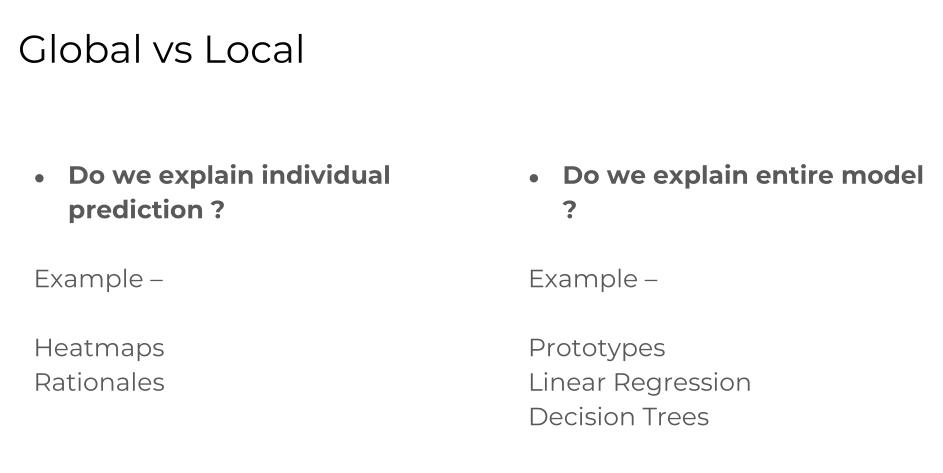

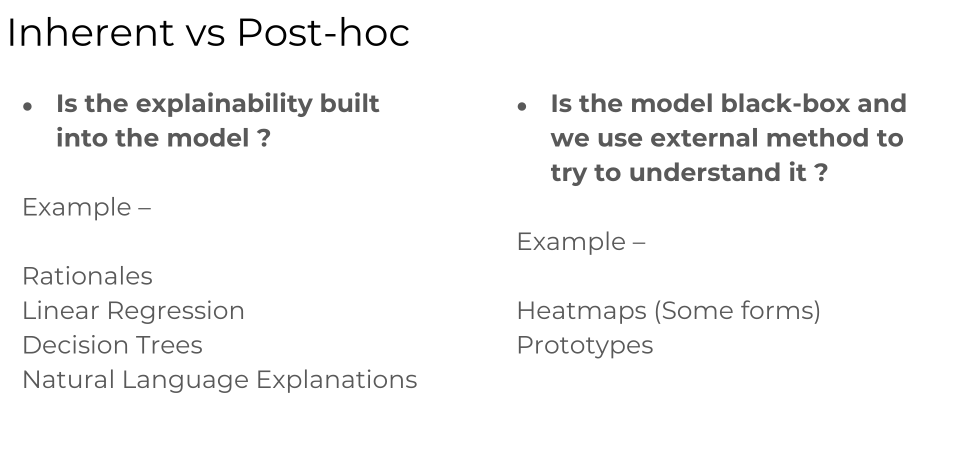

# EXAMPLE OF POST-HOC EXPLANATIONS:
# **Local interpretable model-agnostic explanations (LIME)**
* # Model-agnostic strategy
* # *Local surrogate* models are trained to approximate the predictions of the underlying black box model
* # Instead of training a global surrogate model, LIME focuses on training local surrogate models to explain individual predictions
* # **GOAL**: Fix a sample $\boldsymbol{x}$, and $\color{blue}{\text{understand why the blackbox made a certain prediction on $\boldsymbol{x}$}}$

> 1. # LIME generates a dedicated dataset consisting of perturbed samples from $\boldsymbol{x}$, and the corresponding predictions of the black box model
> 2. # On this new dataset LIME then trains an interpretable model, which is weighted by the *proximity* of the sampled instances to the instance of interest
> 3. # Intepretable model can be any interpretable model, e.g., *linear regression*, *logistic regression*, *decision trees*, etc.
>> * # **The learned model should be a good approximation of the original model predictions locally, but it does not have to be a good global approximation ($\color{blue}{\text{local fidelity}}$)**


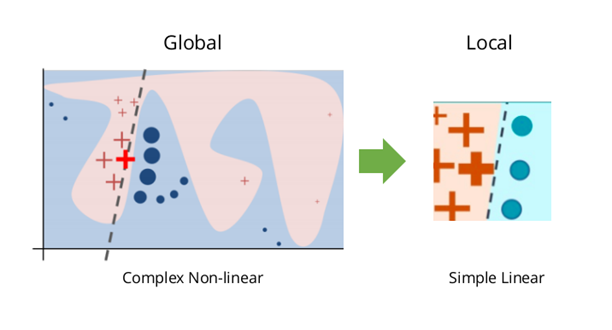

Ribeiro, Marco Tulio, Sameer Singh, and Carlos Guestrin. “Why should I trust you?: Explaining the predictions of any classifier.”
Proceedings of the 22nd ACM SIGKDD international conference on knowledge discovery and data mining. ACM (2016).

# **LIME: Formal definition**
# INPUTS:
1. # $\boldsymbol{x}\in \boldsymbol{X}\subset \mathbb{R}^n$
2. # The orginal **black box** model $f:\boldsymbol{X} → \mathbb{R}$
3. # **$\pi_x$**: **Proximity set**, contains all samples drawn from $\boldsymbol{x}$ (**perturbation function**/perturbed set)
4. # $\boldsymbol{w}_x$:  Weights of samples in $\pi_x$ according to their proximity to $\boldsymbol{x}$ (E.g., Euclidean distance)
4. # **$G$**: **family of interpretable models** (possible expanations)
> * # for example all possible linear regression models on $n$ predictors
5. # **$\Omega$**: a measure of model complexity (e.g., L1 norm of parameter vector)
6. # **Loss** function *L*: to measure how close the explanation $g$ is to the prediction of the original model *f* (L2 loss for example)

# OUTPUT
* # **explainable model** $g_x \in G$ such that:
> # $g_x = \arg\min_{g \in G} L(f, g, \pi_x, \boldsymbol{w}_x) + \Omega(g)$
* # **Model trained for each input instance (weighted by their accuracy)**
> * # We can choose the number $K$ of features in $g_x$ as input parameter (we can reduce features by imposing **sparsity constraints** as $\Omega$)
> * # The lower $K$, the easier it is to interpret the model
> * # On the other side, a higher $K$ potentially produces models with higher fidelity
-------------------------------------------------------

# $\color{blue}{\text{Finally, explains the prediction}}$  $f(\boldsymbol{x})$ $\color{blue}{\text{by intepreting the local model}}$ $g_x(\boldsymbol{x})$

# **LIME data perturbation**
* # Tabular data (used today)
> * # Tabular data is data that comes in tables, with each row representing an instance and each column a feature
>> * # LIME samples $\pi_x$ around the instance of interest $\boldsymbol{x}$ (yellow dot) from a (multivariate) normal distribution (typically represented as a kernel)
>> * # The size of the dot represents their weight
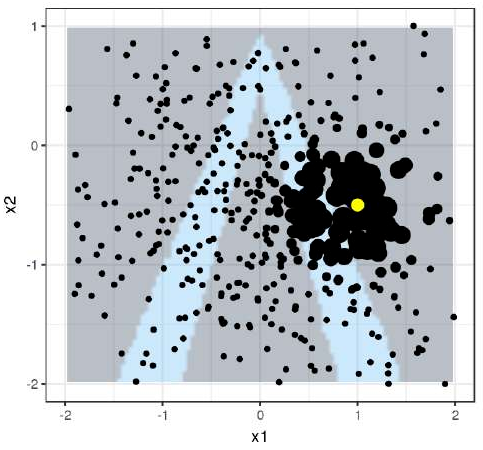

# **Other XAI methods**
 * #  There is a huge set of methods to explain black boxes
 * # E.g., *global methods*, aiming at simulating the predictions of black box model on a subset of instances via an interpretable model
 > * # **Problem**: if the black box is a very complex model, the explainable one will fail in mimicking it
 * # Other local methods like *Shapley values* besed on game theory and similar to LIME  
 * # For an overall review see for instance [this guide](https://originalstatic.aminer.cn/misc/pdf/Molnar-interpretable-machine-learning_compressed.pdf)

# **Let's try an Example**: Pima Indians Diabetes  [Database](https://www.kaggle.com/cjboat/diabetes2)  
* # As you know from Lecture 6, the datasets consist of some clinical predictor (independent) variables and one target (dependent) variable, **Outcome**.
* # Independent variables include the *number of pregnancies* the patient has had, their *BMI*, *insulin level*, *age*, and so on.

* # Let's read and avoid  normalizing it
> # to better interprete results in thi case

In [ ]:
#!curl -O https://frasca.di.unimi.it/MLDNN/diabetes.csv


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   196  100   196    0     0     76      0  0:00:02  0:00:02 --:--:--    76


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
%cd gdrive/MyDrive/MLNDNN/Notebooks/Lecture7/data

/content/gdrive/MyDrive/MLNDNN/Notebooks/Lecture7/data


In [ ]:
%ls

diabetes.csv


In [ ]:
!head diabetes.csv

Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
6,148,72,35,0,33.6,0.627,50,1
1,85,66,29,0,26.6,0.351,31,0
8,183,64,0,0,23.3,0.672,32,1
1,89,66,23,94,28.1,0.167,21,0
0,137,40,35,168,43.1,2.288,33,1
5,116,74,0,0,25.6,0.201,30,0
3,78,50,32,88,31,0.248,26,1
10,115,0,0,0,35.3,0.134,29,0
2,197,70,45,543,30.5,0.158,53,1


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
import pandas as pd
import numpy as np
from sklearn.linear_model import  LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, precision_recall_curve, roc_curve
from sklearn.model_selection import train_test_split,  StratifiedKFold, GridSearchCV
import tensorflow as tf
import pandas as pd
data_file = "diabetes.csv"

data = pd.read_csv(data_file)

data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
data.isnull().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


In [ ]:
data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [ ]:
# some preprocessing. Removing outcome column
y = data['Outcome']
print(f"Number of 0:{(y==0).sum()}")
print(f"Number of 1:{(y==1).sum()}")
data = data.drop('Outcome', axis=1)
colnames= data.columns.values.tolist()
colnames

Number of 0:500
Number of 1:268


['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

# Data Normalization
 * ## with `normalize = False` I skip it now



In [ ]:
normalize = False
if normalize:
  sscaler = StandardScaler()
  mmscaler = MinMaxScaler()
  dbt_tf = ColumnTransformer(
      transformers=[
          ('other', sscaler, colnames[:-1]),
          ('Age', mmscaler, ['Age'])
      ],
      verbose_feature_names_out = False
  )
  dbt_tf.fit(data)
  new_data = pd.DataFrame(dbt_tf.transform(data)
                              ,columns=dbt_tf.get_feature_names_out()
                              )
else:
  new_data = data
new_data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


# **Training a simple MLP for the outcome**
 * # We use a **two unit softmax output** model, because the LIME package needs a probability distribution as prediction

In [ ]:
# Load useful libraries
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow
# Create Train & Test Data
X_train, X_test, y_train, y_test = train_test_split(new_data,
                                                    y,
                                                    test_size=0.3,
                                                    stratify =y,
                                                    random_state = 13)
nhidden = [30, 25]
dropout_rate = 0.15
learning_rate = 5*10**-3
input_shape = X_train.shape[1]
print(f"input_shape:{input_shape}")
# Build the model
model = Sequential()
model.add(Dense(nhidden[0],
                  input_shape=(input_shape,),
                  activation="relu",
                kernel_regularizer="l2"))
# set dropout regularization
model.add(Dropout(dropout_rate))
model.add(Dense(nhidden[1],
                activation="relu",
                kernel_regularizer="l2"))
model.add(Dropout(dropout_rate))
model.add(Dense(2, activation="softmax"))
model.compile(loss="SparseCategoricalCrossentropy",
      optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
      metrics=['accuracy'])
early_stopping = tensorflow.keras.callbacks.EarlyStopping(
    monitor="accuracy", patience=10, restore_best_weights=True)

input_shape:8


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


# **NOTE: since we do not perform a model selection here, we can use the testing data as validation data to show the performance during training**

In [ ]:
bs = 16
epochs = 150
history = model.fit(X_train,
                    y_train,
                    shuffle=True,
                    batch_size=bs,
                    epochs = epochs,
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping])

Epoch 1/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - accuracy: 0.5528 - loss: 13.1920 - val_accuracy: 0.6450 - val_loss: 3.6773
Epoch 2/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5973 - loss: 2.4147 - val_accuracy: 0.6753 - val_loss: 1.0753
Epoch 3/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6038 - loss: 1.3801 - val_accuracy: 0.6797 - val_loss: 1.0668
Epoch 4/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6126 - loss: 1.1851 - val_accuracy: 0.6407 - val_loss: 0.9252
Epoch 5/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6495 - loss: 0.9817 - val_accuracy: 0.6537 - val_loss: 0.9120
Epoch 6/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6795 - loss: 0.8802 - val_accuracy: 0.6537 - val_loss: 0.8969
Epoch 7/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6245 - loss: 0.9360 - val_accuracy: 0.6667 - val_loss: 0.8706
Epoch 8/150
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6843 - loss: 0.8378 - val_accuracy: 0.6580 -

In [ ]:
import numpy as np
from sklearn.metrics import classification_report
y_pred = np.array([1 if x[1] >= 0.5 else 0 for x in model.predict(X_test)])
print(f"sum(y_pred):{sum(y_pred)}")
# Classification Report
print(f"Tesing performance:\n {classification_report(y_pred, y_test)}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
sum(y_pred):38
Tesing performance:
               precision    recall  f1-score   support

           0       0.92      0.72      0.80       193
           1       0.32      0.68      0.44        38

    accuracy                           0.71       231
   macro avg       0.62      0.70      0.62       231
weighted avg       0.82      0.71      0.74       231



In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 15.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=9e2f0319b20303e3491a322772dadacfcad274bdd6e251f7680e40bc44e21515
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


# [LimeTabularExplainer](https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_tabular)
* # ```kernel``` defines how to parse pairwise similarities construct $\pi_x$
* # ```feature_selection``` specifies the method to select features
* # $\pi_x$ is created by injecting normal noise

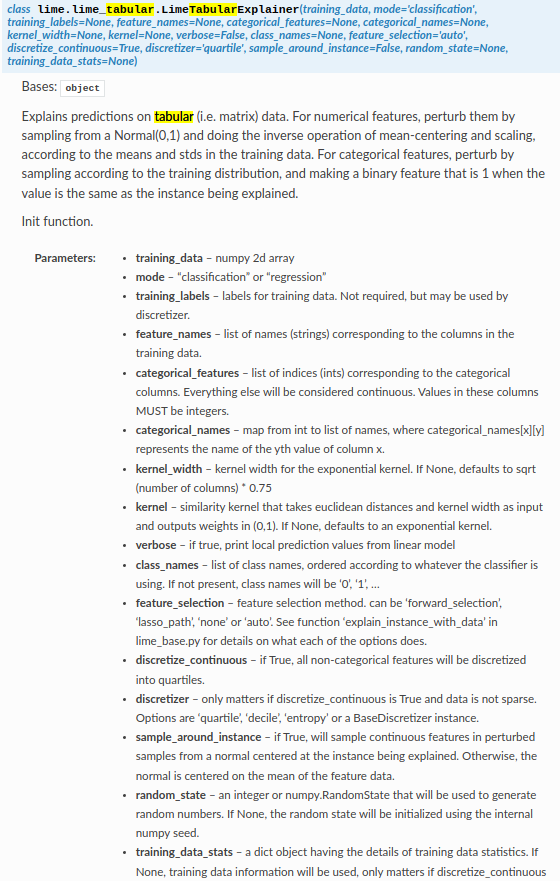

In [ ]:
import lime
from lime.lime_tabular import LimeTabularExplainer
class_names = ['No diabetes', 'Has diabetes']
feature_names = colnames
# Fit the Explainer on the training data set using the LimeTabularExplainer
#  X_train.values extract data as numpy ndarray
explainer = LimeTabularExplainer(X_train.values, feature_names =
                                 feature_names,
                                 class_names = class_names,
                                 mode = 'classification')


# **Explain an observation**
# ```ExplainIstance``` method of `LimeTabularExplainer`
* # ```data_row``` is now the feature vector of the sample we want to explain
* #  ```sampling_method``` is the strategy to sample artificial instances from synthetic data from $\boldsymbol{x}$
* # `model_regressor` alows to select the surrogate model to be used
  * ## can be a `sklearn` model able to output probabilities

# For model explanation, one needs to supply the observation and the model predicted probabilities.

# **you can plot a detailed explanation using the ```show_in_notebook( )``` function**


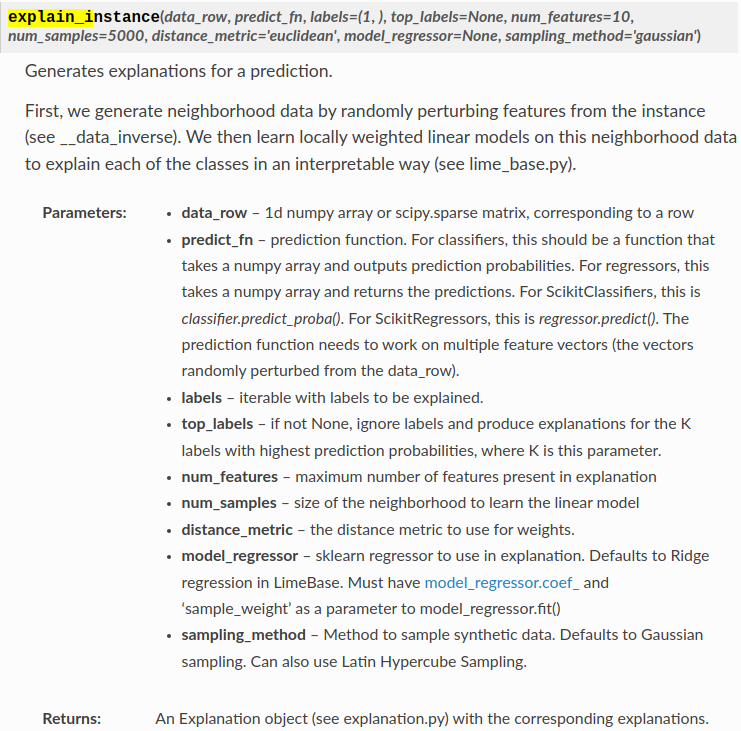

# Two arguments are relevant to compute
1. # **distance_metric**
   * # It is the function to compute the proximity of sample $\boldsymbol{x}$ and the artificially generated neighbors
   * # The documentation is not clear on its possibile values, apart that the default one is Euclidean one
   * # To get a list of the possibile values, I had a look at the source code, which says: any metric from ```sklearn.metrics.pairwise_distances```, where in turn, we can find the following list:  ‘braycurtis’, ‘canberra’, ‘chebyshev’, ‘cityblock’, ‘correlation’, ‘cosine’, ‘dice’, ‘euclidean’, ‘hamming’, ‘jaccard’, ‘jensenshannon’, ‘kulczynski1’, ‘mahalanobis’, ‘matching’, ‘minkowski’, ‘rogerstanimoto’, ‘russellrao’, ‘seuclidean’, ‘sokalmichener’, ‘sokalsneath’, ‘sqeuclidean’, ‘yule’
   * # Not all of them will be suitable for this case (e.g., Hamming distance requires binary vectors)
   2. # **num_samples**
   * # The number of synthetic samples to be generate locally at $\boldsymbol{x}$
   > * # It is one of the crucial element of this method (see exercise below)

# We'll use the default values to explain the instance of index $1$

In [ ]:
temp=model.predict(X_test)
ind = 1
#Perform the explanation on the 1th instance in the test data
explanation = explainer.explain_instance(X_test.iloc[ind], model.predict)
print(f"original label:{y_test.iloc[ind]}")
print(f"predicted label:{temp[ind]}")
explanation.as_list()

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
 75/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
original label:0
predicted label:[0.6538375  0.34616247]


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

[('99.00 < Glucose <= 116.00', -0.09530454469907332),
 ('Insulin <= 0.00', 0.07221695671465404),
 ('Age <= 24.00', -0.027203027713358058),
 ('62.00 < BloodPressure <= 70.00', 0.018842441258592024),
 ('1.00 < Pregnancies <= 3.00', -0.01609630677301615),
 ('0.00 < SkinThickness <= 24.00', -0.008089131594244977),
 ('0.39 < DiabetesPedigreeFunction <= 0.65', -0.003815724595334319),
 ('27.60 < BMI <= 32.40', 0.0021070125427843167)]

In [ ]:
# show the result of the model's explaination
explanation.show_in_notebook(show_table = True, show_all = False)

* # Colored bars represent the features relevant for that class
* # The higher the value the more relevant the feature
> * # e.g., ***Glucose* value is the most discriminant for the classifier choice**

# We can reduce the number of features to be used by the surrogate model, reinvoking the ``explain_instance`` method with the attribute ``num_features`` set to $5$

In [ ]:
#Let's select just 5 features
ind = 1
#Perform the explanation on the 1th instance in the test data
explanation = explainer.explain_instance(X_test.iloc[ind],
                                          model.predict,
                                          num_features=5)
print(f"original label:{y_test.iloc[ind]}")
print(f"predicted label:{temp[ind]}")
print(explanation.as_list())
# show the result of the model's explaination
explanation.show_in_notebook(show_table = True, show_all = False)

 26/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
original label:0
predicted label:[0.6538375  0.34616247]
[('99.00 < Glucose <= 116.00', -0.09663566849625689), ('Insulin <= 0.00', 0.08207626060635534), ('Age <= 24.00', -0.03712696485601356), ('62.00 < BloodPressure <= 70.00', 0.014947155852784628), ('0.00 < SkinThickness <= 24.00', -0.010101909250081705)]


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

# **The explanation might be affected by randomness**
> * ## But not the prediction
> * ## In this case the top $4$ features are stable

# Let's try another sample

In [ ]:
ind = 23

#Perform the explanation on the 8th instance in the test data
explanation = explainer.explain_instance(X_test.iloc[ind,:], model.predict)
print(f"original label:{y_test.iloc[ind]}")
print(f"predicted label:{y_pred[ind]}")
# show the result of the model's explaination
explanation.show_in_notebook(show_table = True, show_all = False)

 24/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
original label:1
predicted label:1


/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:427: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

# For test patient id 23, both ```BloodPressure, Insulin``` are more relevant for the final prediction as positive/diabetes patient

# SUMMARY: **We need to evaluate 1) how much our black box model is accurate; 2) How much the local model is accurate in simulating the black box**

# **LIME data types** ([docs](https://lime-ml.readthedocs.io/en/latest/lime.html#))
* # LIME can be applied to different data types, like text and images
* # **Text**
> * # LIME for text differs from LIME for tabular data.
> * # Variations of the data are generated differently: Starting from the original text, new texts are created by randomly removing words from the original text.
> * # The dataset is represented with binary features for each word. A feature is 1 if the corresponding word is included and 0 if it has been removed
> * # the class to be used is ```LimeTextExplainer()```
> * # Suitable even for RNN, see for instance workout example [here](https://towardsdatascience.com/interpreting-an-lstm-through-lime-e294e6ed3a03)

* # **Images**
> * # LIME for images works differently than LIME for tabular data and text
>> * # it would not make much sense to perturb individual pixels, since many more than one pixel contribute to one class.
>> * # Randomly changing individual pixels would probably not change the predictions by much
> * # Variations of the images are created by **segmenting the image** into “superpixels” and turning superpixels off or on
>> * # Superpixels are interconnected pixels with similar colors and can be turned off by replacing each pixel with a user-defined color such as gray
> * # We can still use the same local, interpretable model for explanation

> * # For image data, we need to use a dedicated function called ```LimeImageExplainer()``` and its corresponding ```explain_istance```

# **LIME**
 * # Advantages
 > * # Even very complex black boxes can results `simple' locally
 > * # Local surrogate models can be selected in realm of inherently easy to inteprete model
 > * # LIME is one of the few methods that works for tabular data, text and images

 * # Disavantages
 > * # The correct definition of the neighborhood is a very big, unsolved problem when using LIME with tabular data.
 >> * # To mitigate it, try different ```kernel_width``` in ```LimeTabularExplainer``` to evaluate different local models and their effectiveness
 >> * # Iterate multiple times and check explanation

# **MIXED INPUT DATA TYPES: MULTIPLE INPUT NETWORKS**
* ## In Keras to accept multiple inputs we need to define them via different **Input** layers
* ## For example:

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, Conv2D, MaxPooling2D,\
                                    Flatten, Concatenate
n_feat = 5
input_shape_1 = (n_feat,)   # numerical features
input_shape_2 = (28,28,1) # images


inputA = Input(shape=input_shape_1, dtype='float32', name="inputA")
inputB = Input(shape=input_shape_2, dtype='float32', name="inputB")


* ## Once we have the two (or more) inputs, we can parse them with distinct layers

In [ ]:
n_units = 10
x1 = Dense(n_units, activation='relu',
                  name="dense")(inputA)


x2 = Conv2D(64, kernel_size=(3,3), padding = "same",
                 activation='relu', name="cnn")(inputB)

#share = Dense(20, activation = "relu")
#out1 = share(x1) # x1 and x2 have the the same shape
#out2 = share(x2)

* ## From now on, the two lines could proceed separately
* ## If we have one single output in the model, we need to merge them at a certain points
* ##  so we need to flatten the convolutional output, and concatenate it with the dense layer output
   * ### For that we use the ```Concatenate``` Keras merge layer

In [ ]:
x2 = Flatten()(x2)
merge = Dense(n_units, activation='relu',
                  name="merge")(Concatenate()([x1, x2]))


# Then we can add a classification layer and create the model

In [ ]:
from tensorflow.keras.models import Model
num_classes = 10
out = Dense(num_classes, activation='softmax',
                  name="output")(merge)
model = Model(inputs=[inputA, inputB],
                  outputs=out,
                  name='Combined_input_Image_and_features')

# **Plotting the model**

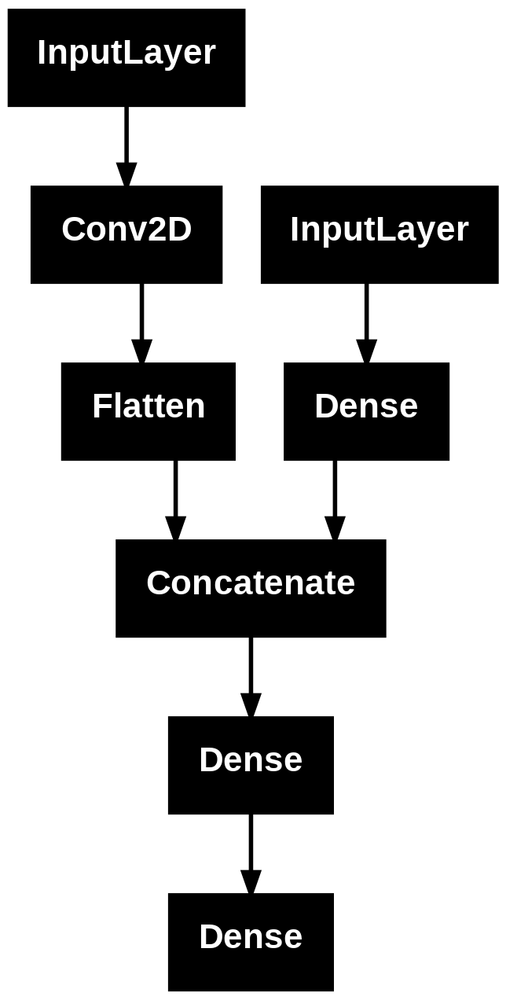

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model)

# Loading MNIST data

In [ ]:
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
# dense is a fully connected layer
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
import numpy as np
from keras.datasets import mnist
from sklearn.preprocessing import StandardScaler, MinMaxScaler
(X_train, y_train), (X_test, y_test) = mnist.load_data()
print(f"X_train.shape:{X_train.shape},\
    X_train type :{type(X_train)}")


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
X_train.shape:(60000, 28, 28),    X_train type :<class 'numpy.ndarray'>


# Let's create some random features for the ``inputA`` to test the multi input model

In [ ]:
train_feat = np.random.rand(X_train.shape[0], n_feat)
test_feat = np.random.rand(X_test.shape[0],n_feat)

# **Compiling and fitting the model**
* ## the different inputs should be fed or in a *list preserving the order of the input*, or into a *dictionary specifying the corresponding input layer name*

In [ ]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
batch_size = 128
epochs = 5 # a few epochs, just the verify it works
model.fit(x=[train_feat, X_train],
          y=y_train,
          epochs=epochs,
          batch_size = batch_size)

Epoch 1/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.1070 - loss: 2.7840
Epoch 2/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.1121 - loss: 2.3013
Epoch 3/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1114 - loss: 2.3016
Epoch 4/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1121 - loss: 2.3012
Epoch 5/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1136 - loss: 2.3011


# Varaint with inputs cast into a dictionary

In [ ]:
model = Model(inputs=[inputA, inputB],
                  outputs=out,
                  name='Combined_input_Image_and_features')
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
# with the dictionary we can neglect the position of the inputs
model.fit(x={'inputB':X_train, 'inputA':train_feat},
          y=y_train,
          epochs=epochs,
          batch_size = batch_size)

Epoch 1/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.1121 - loss: 2.3013
Epoch 2/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.1148 - loss: 2.3008
Epoch 3/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1115 - loss: 2.3015
Epoch 4/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1140 - loss: 2.3010
Epoch 5/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.1143 - loss: 2.3011


# **Multiple outputs models**
* ## Now instead we want our model to output different predictions
    * ### For instance a multiclass softmax output, and four real values denoting the box containing the object in the image
    * ### We need to supply to the ```Model``` class constructor a list containing the two (or more) outputs
    * ### We will have a bifurcation at the end, after the convolutional blocks

In [ ]:
n_feat = 5
input_shape = (28,28,1) # images
input = Input(shape=input_shape, dtype='float32', name="input")
x = Conv2D(64, kernel_size=(3,3), padding = "same",
                 activation='relu', name="cnn")(input)
x = Conv2D(32, kernel_size=(3,3),
                 padding = "same",
                 activation='relu')(x)
x = Conv2D(16, kernel_size=(2,2),
                 padding = "same",
                 activation='relu')(x)
x = MaxPooling2D(pool_size=(2, 2))(x) # downsizing images
x = Flatten()(x) # flattening output feature maps
x = Dense(32, activation='relu')(x)




# Now we can use x, the output of the last layer, to feed both outputs layers
* ## we assume the box is repsented as coordinates in [0,1], as relative shift
* ## so we ca use a ```sigmoid``` activation

In [ ]:
 # both layers receives x
out_class = Dense(num_classes, activation='softmax', name="multiclass_out")(x)

out_box = Dense(4, activation='sigmoid', name="box_out")(x)

model2 = Model(inputs=input,
                  outputs=[out_class,out_box],
                  name='Combined_output_Image_and_box')

# As loss function we need to use two different losses for the two outputs
* ## We can proceed similarly to the multi-input case, we define a dictionary of losses, each with the corresponding output name

In [ ]:
loss_dict = {
        "multiclass_out": tf.keras.losses.sparse_categorical_crossentropy,
        "box_out": tf.keras.losses.MeanSquaredError()
    }
metric_dict =  {
        "multiclass_out": 'accuracy',
        "box_out": 'mse'
    }

In [ ]:
model2.compile(optimizer='adam',
              loss=loss_dict,
              metrics=metric_dict)

# Creating random boxes just as test

In [ ]:
train_box = np.random.rand(X_train.shape[0], 4)
test_box = np.random.rand(X_test.shape[0], 4)
print(train_box.shape, np.max(train_box))
print(np.min(train_box))

(60000, 4) 0.9999998798680862
3.815349501334886e-06


# Analogously to the multi-input case when feeding the training data to fit method, here we need to split the training labels when invoking the fit
* ## Like before, two possibilities: a list preserving the order, or a dictionary

In [ ]:
batch_size = 128
epochs = 5 # a few epochs, just the verify it works
model2.fit(x=X_train,
          y={'multiclass_out':y_train,
             'box_out': train_box},
          epochs=epochs,
          batch_size = batch_size)

Epoch 1/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - box_out_loss: 0.1747 - box_out_mse: 0.1747 - loss: 1.1142 - multiclass_out_accuracy: 0.7872 - multiclass_out_loss: 0.9395
Epoch 2/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - box_out_loss: 0.0909 - box_out_mse: 0.0909 - loss: 0.1647 - multiclass_out_accuracy: 0.9782 - multiclass_out_loss: 0.0738
Epoch 3/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - box_out_loss: 0.0864 - box_out_mse: 0.0864 - loss: 0.1365 - multiclass_out_accuracy: 0.9846 - multiclass_out_loss: 0.0500
Epoch 4/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - box_out_loss: 0.0847 - box_out_mse: 0.0847 - loss: 0.1255 - multiclass_out_accuracy: 0.9870 - multiclass_out_loss: 0.0408
Epoch 5/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - box_out_loss: 0.0840 - box_out_mse: 0.0840 - loss: 0.1130 - multiclass_out_accuracy: 0.9907 - multiclass_out_loss: 0.0291


# **POTENTIAL MOCK EXAM**
> # Let's discuss it together

 * # We are given a dataset containing movie reviews along with their associated binary sentiment polarity labels
 * # All the reviews comprehensively contain $n=89527$ unique words
 * # For any review, two descriptions are avaialble:
 > * # 1. The raw text of the review (typically no more than $200$ words). For example:
$\color{blue}{\text{"Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as 'Teachers'"...}}$
 > * # 2. Already-tokenized bag of words (BoW) features. That is, *sparse* numeric $n$-dimensional vectors contanining the absolute frequency of each of the $n$ words in the review
 >   * # Each distinct word is associated with an index in the vector. For example: a vector $[1, 2, 0, 1, 0, 1, 5, 0, 0, 0, \ldots]$ means that the word associated with index $0$ occurs $1$ time, the word associated with index $1$ occurs $2$ times, and so on.

 * # **Reviews are labeled**: for any *negative* review we have an integer score $\leq 4$ out of $10$, and for a *positive* review an integer score $\geq 7$ out of $10$. Reviews with more neutral ratings are not included in the dataset.

* # **AIM**:   
# **Design a deep neural network (or more) to predict the rating of reviews, providing**:

1. #  How would you represent the input of the DNN (vector, matrix, multiple inputs etc.)  
2. #  How would you design the output layer
3. # Which activation functions would you use
4. # Which Loss function
5. # Which (possible) regularizers, initializers, normalizers, etc.
6. # On which hyperparameters would you perform the model selection and why
7. # How to evaluate the test performance (suppose you're given a test set of the same type than training set)

#- **Motivate the choices you made.**